In [1]:
import matplotlib.pyplot as plt
import numpy as np
import cv2
import os

In [2]:
folder_task = '/home/xingguang/Documents/ECE661/hw3/hw3_Task1_Images/Images'
path_1 = os.path.join(folder_task, '1.jpeg')
path_2 = os.path.join(folder_task, '2.jpeg')
path_3 = os.path.join(folder_task, '3.jpeg')
outpath_1 = os.path.join(folder_task, 'onestep1.jpeg')
outpath_2 = os.path.join(folder_task, 'onestep2.jpeg')
outpath_3 = os.path.join(folder_task, 'onestep3.jpeg')

img_1 = cv2.cvtColor(cv2.imread(path_1), cv2.COLOR_BGR2RGB)
img_2 = cv2.cvtColor(cv2.imread(path_2), cv2.COLOR_BGR2RGB)
img_3 = cv2.cvtColor(cv2.imread(path_3), cv2.COLOR_BGR2RGB)

In [61]:
def choosePQRS(img=1):
    if img == 1:
        P = [472, 118]
        Q = [449, 562]
        S = [1406, 448]
        R = [1447, 715]
        K = [705, 346]
        M = [705, 376]
        N = [725, 383]
        # 726, 353
        # K = [525, 242]
        # M = [511, 635]
        # N = [879, 682]

    if img == 2:
        P = [382, 576]
        Q = [379, 834]
        S = [593, 551]
        R = [606, 922]
        K = [425, 231]
        M = [425, 346]
        N = [515, 298]

    if img == 3:
        P = [2062, 698] #2nd
        Q = [2096, 1479]
        S = [2668, 717]
        R = [2694, 1333]
        K = [2089, 738]
        M = [2652, 749]
        N = [2674, 1301]

    return np.asarray([P, Q, S, R, K, M, N])

    
def definePQRS(width, height):
    P = [0, 0]
    Q = [0, height]
    S = [width, 0]
    R = [width, height]
    return np.asarray([P, Q, S, R])

range_1 = choosePQRS(1)
range_2 = choosePQRS(2)
range_3 = choosePQRS(3)

In [62]:
def HomoOnestep(points):
    PQSRKMN = np.concatenate((points, np.ones((7, 1))), axis=1)
    PQ=np.cross(PQSRKMN[0], PQSRKMN[1])
    PS=np.cross(PQSRKMN[0], PQSRKMN[2])
    SR=np.cross(PQSRKMN[2], PQSRKMN[3])
    RQ=np.cross(PQSRKMN[3], PQSRKMN[1])
    KM=np.cross(PQSRKMN[4], PQSRKMN[5])
    MN=np.cross(PQSRKMN[5], PQSRKMN[6])
    # KM=np.cross(PQSRKMN[0], PQSRKMN[3])
    # MN=np.cross(PQSRKMN[1], PQSRKMN[2])

    A=np.zeros((5,5))
    B=np.zeros((5,1))
    A[0,:]=[PQ[0]*PS[0], 0.5*(PQ[1]*PS[0]+PQ[0]*PS[1]), PQ[1]*PS[1], 0.5*(PQ[0]*PS[2]+PQ[2]*PS[0]), 0.5*(PQ[2]*PS[1]+PQ[1]*PS[2])]
    A[1,:]=[PS[0]*SR[0], 0.5*(PS[1]*SR[0]+PS[0]*SR[1]), PS[1]*SR[1], 0.5*(PS[0]*SR[2]+PS[2]*SR[0]), 0.5*(PS[2]*SR[1]+PS[1]*SR[2])]
    A[2,:]=[SR[0]*RQ[0], 0.5*(SR[1]*RQ[0]+SR[0]*RQ[1]), SR[1]*RQ[1], 0.5*(SR[0]*RQ[2]+SR[2]*RQ[0]), 0.5*(SR[2]*RQ[1]+SR[1]*RQ[2])]
    A[3,:]=[RQ[0]*PQ[0], 0.5*(RQ[1]*PQ[0]+RQ[0]*PQ[1]), RQ[1]*PQ[1], 0.5*(RQ[0]*PQ[2]+RQ[2]*PQ[0]), 0.5*(RQ[2]*PQ[1]+RQ[1]*PQ[2])]
    A[4,:]=[KM[0]*MN[0], 0.5*(KM[1]*MN[0]+KM[0]*MN[1]), KM[1]*MN[1], 0.5*(KM[0]*MN[2]+KM[2]*MN[0]), 0.5*(KM[2]*MN[1]+KM[1]*MN[2])]
        
    B[0]=-PQ[2]*PS[2]
    B[1]=-PS[2]*SR[2]
    B[2]=-SR[2]*RQ[2]
    B[3]=-RQ[2]*PQ[2]
    B[4]=-KM[2]*MN[2]

    C = np.matmul(np.linalg.pinv(A),B).squeeze()
    C = C/np.max(C)

    S = np.asarray([[C[0], 0.5*C[1]], [0.5*C[1], C[2]]])
    U, D, VT = np.linalg.svd(S)
    Dsquare = np.diag(np.sqrt(D))
    K = np.dot(VT, np.dot(Dsquare, VT))
    s = np.asarray([[0.5*C[3]], [0.5*C[4]]])
    v = np.dot(np.linalg.inv(K), s)
    H = np.asarray([[K[0,0],K[0,1],0],[K[1,0],K[1,1],0],[v[0,0],v[1,0],1]])
    return H

In [21]:
def projTransform(H, source):
    nps = source.shape[0]
    source_rep = np.concatenate((source, np.ones((nps,1))), axis=1)
    t_homo = np.matmul(H, source_rep.T).T
    t_norm = t_homo / t_homo[:,2].reshape((nps,1))
    return t_norm[:,:2]

In [22]:
def projResizeRange(source, H, limit):
    r = definePQRS(source.shape[1], source.shape[0])
    expanded = projTransform(H, r)
    l, r = np.amin(expanded[:, 0]), np.amax(expanded[:, 0])
    t, b = np.amin(expanded[:, 1]), np.amax(expanded[:, 1])

    height, width = (b-t), (r-l)
    if height > limit or width > limit:
        s_r = limit / height if height>width else limit/width
    else:
        s_r = 1
    H = np.linalg.inv(H)
    out = np.zeros((int((b-t)*s_r), int((r-l)*s_r), 3), dtype=source.dtype)
    print("Size of undistorted image is:", out.shape)
    for i in range(out.shape[0]):
        for j in range(out.shape[1]):
            coor_source = np.asarray([[j/s_r+l, i/s_r+t]])
            coor_target = projTransform(H, coor_source).squeeze()
            h, w = int(coor_target[1]), int(coor_target[0])
            if 0 <= h < source.shape[0] and 0 <= w <source.shape[1]:
                out[i,j,:] = source[h, w,:]
    return out

[[ 2.66581325e-01 -1.15799125e-01  0.00000000e+00]
 [-1.15799125e-01  9.93272653e-01  0.00000000e+00]
 [ 1.32934854e-04 -2.16509173e-04  1.00000000e+00]]
Size of undistorted image is: (583, 3000, 3)


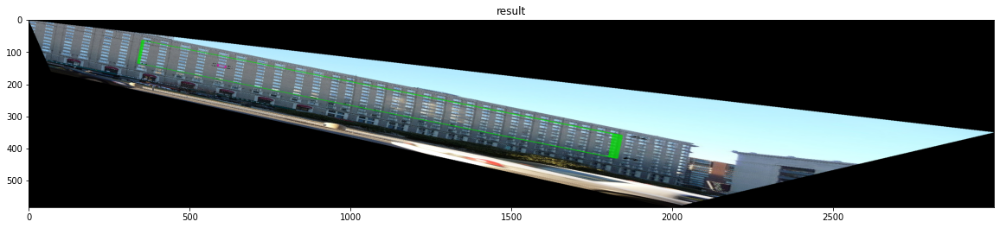

In [65]:
H = HomoOnestep(range_1)
result = projResizeRange(img_1, np.linalg.inv(H), 3000)
cv2.imwrite(outpath_1, cv2.cvtColor(result, cv2.COLOR_RGB2BGR))
plt.figure(figsize=(20,40))
plt.title('result')
plt.imshow(result)

Size of undistorted image is: (420, 1169, 3)


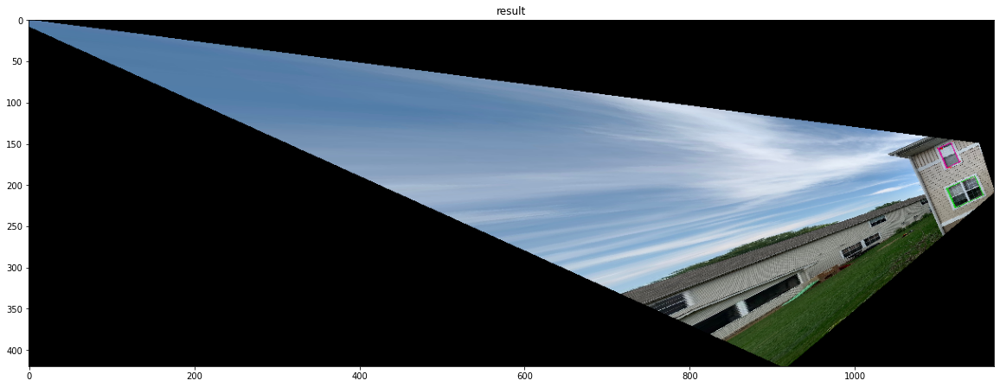

In [24]:
H = HomoOnestep(range_2)

result = projResizeRange(img_2, np.linalg.inv(H), 3000)
cv2.imwrite(outpath_2, cv2.cvtColor(result, cv2.COLOR_RGB2BGR))
plt.figure(figsize=(20,40))
plt.title('result')
plt.imshow(result)

Size of undistorted image is: (3000, 2825, 3)


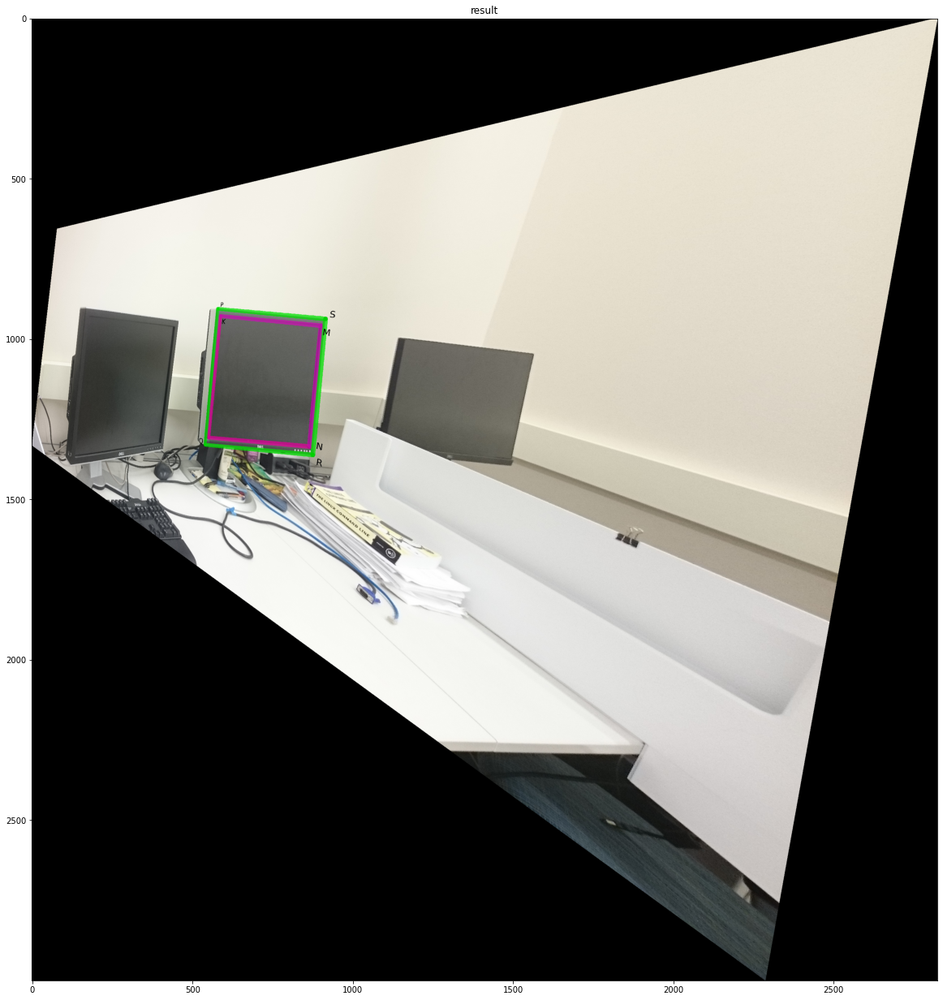

In [25]:
H = HomoOnestep(range_3)

result = projResizeRange(img_3, np.linalg.inv(H), 3000)
cv2.imwrite(outpath_3, cv2.cvtColor(result, cv2.COLOR_RGB2BGR))
plt.figure(figsize=(20,40))
plt.title('result')
plt.imshow(result)

In [26]:
folder_task = '/home/xingguang/Documents/ECE661/hw3/hw3_Task2_Images/Images'
path_1 = os.path.join(folder_task, '1.jpeg')
path_2 = os.path.join(folder_task, '2.jpeg')
path_3 = os.path.join(folder_task, '3.jpeg')
outpath_1 = os.path.join(folder_task, 'onestep1.jpeg')
outpath_2 = os.path.join(folder_task, 'onestep2.jpeg')
outpath_3 = os.path.join(folder_task, 'onestep3.jpeg')

img_1 = cv2.cvtColor(cv2.imread(path_1), cv2.COLOR_BGR2RGB)
img_2 = cv2.cvtColor(cv2.imread(path_2), cv2.COLOR_BGR2RGB)
img_3 = cv2.cvtColor(cv2.imread(path_3), cv2.COLOR_BGR2RGB)

In [27]:
def choosePQRS(img=1):
    if img == 1:
        P = [2101, 493]
        Q = [2075, 1473]
        S = [2637, 652]
        R = [2661, 1556]
        K = [2202, 919]
        M = [2613, 1014]
        N = [2603, 689]

    if img == 2:
        P = [1128, 883]
        Q = [945, 2027]
        S = [2180, 1308]
        R = [2129, 2195]
        K = [988, 830]
        M = [802, 1904]
        N = [1519, 2020]

    if img == 3:
        P = [495, 232] 
        Q = [453, 3189]
        S = [2406, 309]
        R = [2263, 3245]
        K = [631, 2846]
        M = [2131, 2891]
        N = [2120, 3174]

    return np.asarray([P, Q, S, R, K, M, N])

range_1 = choosePQRS(1)
range_2 = choosePQRS(2)
range_3 = choosePQRS(3)

Size of undistorted image is: (3000, 2915, 3)


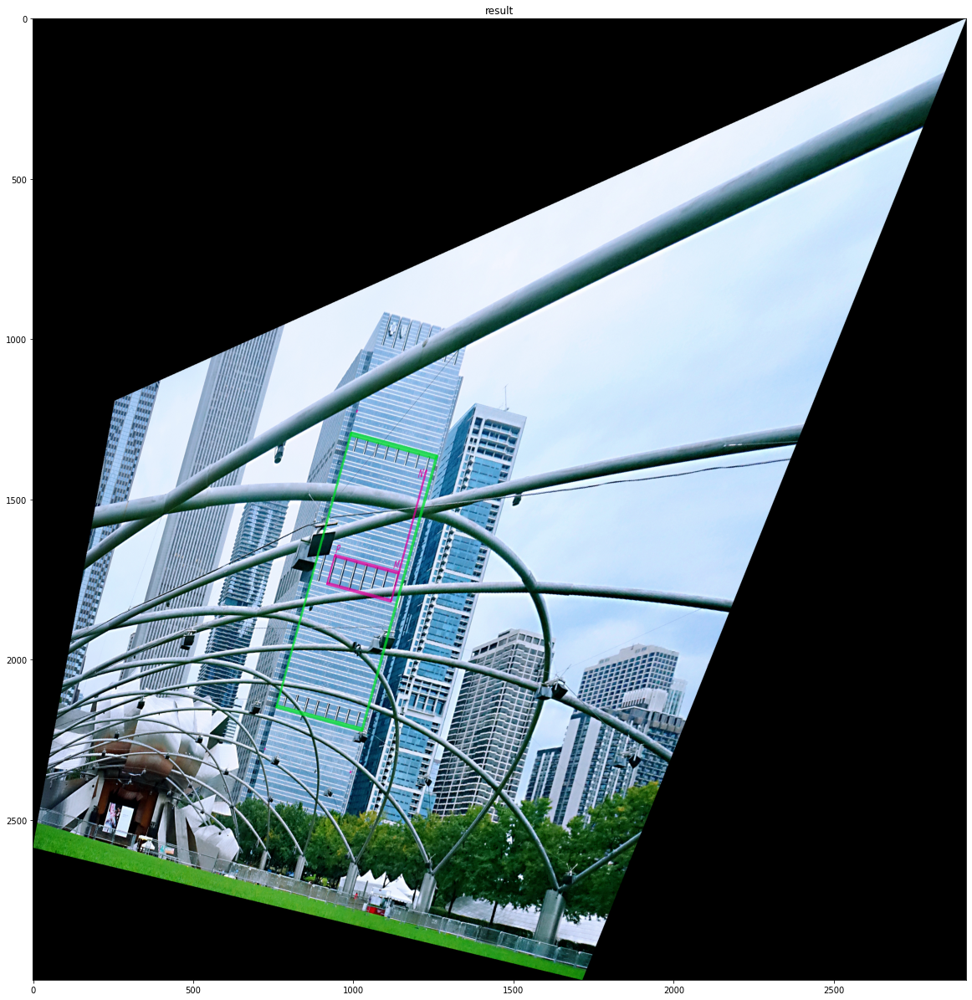

In [28]:
H = HomoOnestep(range_1)

result = projResizeRange(img_1, np.linalg.inv(H), 3000)
cv2.imwrite(outpath_1, cv2.cvtColor(result, cv2.COLOR_RGB2BGR))
plt.figure(figsize=(20,40))
plt.title('result')
plt.imshow(result)

Size of undistorted image is: (1393, 3000, 3)


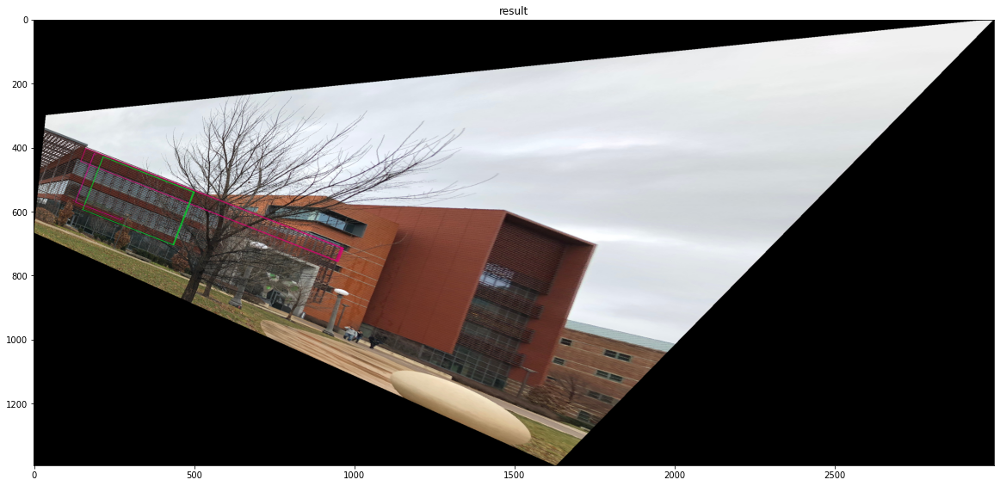

In [29]:
H = HomoOnestep(range_2)

result = projResizeRange(img_2, np.linalg.inv(H), 3000)
cv2.imwrite(outpath_2, cv2.cvtColor(result, cv2.COLOR_RGB2BGR))
plt.figure(figsize=(20,40))
plt.title('result')
plt.imshow(result)

Size of undistorted image is: (3000, 1264, 3)


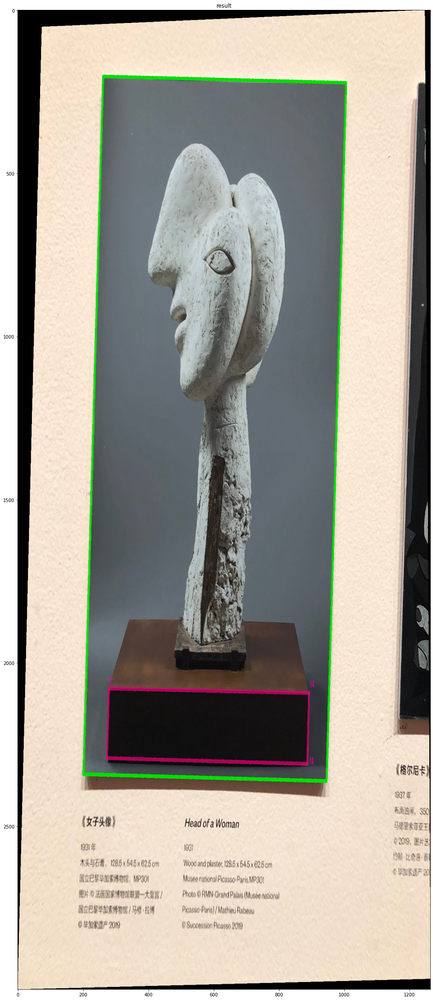

In [30]:
H = HomoOnestep(range_3)

result = projResizeRange(img_3, np.linalg.inv(H), 3000)
cv2.imwrite(outpath_3, cv2.cvtColor(result, cv2.COLOR_RGB2BGR))
plt.figure(figsize=(20,40))
plt.title('result')
plt.imshow(result)

In [7]:
def HomoOnestep(points):
    PQSRKMN = np.concatenate((points, np.ones((7, 1))), axis=1)
    PQ=np.cross(PQSRKMN[0], PQSRKMN[1])
    PS=np.cross(PQSRKMN[0], PQSRKMN[2])
    SR=np.cross(PQSRKMN[2], PQSRKMN[3])
    RQ=np.cross(PQSRKMN[3], PQSRKMN[1])
    KM=np.cross(PQSRKMN[4], PQSRKMN[5])
    MN=np.cross(PQSRKMN[5], PQSRKMN[6])
    # KM=np.cross(PQSRKMN[0], PQSRKMN[3])
    # MN=np.cross(PQSRKMN[1], PQSRKMN[2])

    A=np.zeros((5,5))
    B=np.zeros((5,1))
    A[0,:]=[PQ[0]*PS[0], 0.5*(PQ[1]*PS[0]+PQ[0]*PS[1]), PQ[1]*PS[1], 0.5*(PQ[0]*PS[2]+PQ[2]*PS[0]), 0.5*(PQ[2]*PS[1]+PQ[1]*PS[2])]
    A[1,:]=[PS[0]*SR[0], 0.5*(PS[1]*SR[0]+PS[0]*SR[1]), PS[1]*SR[1], 0.5*(PS[0]*SR[2]+PS[2]*SR[0]), 0.5*(PS[2]*SR[1]+PS[1]*SR[2])]
    A[2,:]=[SR[0]*RQ[0], 0.5*(SR[1]*RQ[0]+SR[0]*RQ[1]), SR[1]*RQ[1], 0.5*(SR[0]*RQ[2]+SR[2]*RQ[0]), 0.5*(SR[2]*RQ[1]+SR[1]*RQ[2])]
    A[3,:]=[RQ[0]*PQ[0], 0.5*(RQ[1]*PQ[0]+RQ[0]*PQ[1]), RQ[1]*PQ[1], 0.5*(RQ[0]*PQ[2]+RQ[2]*PQ[0]), 0.5*(RQ[2]*PQ[1]+RQ[1]*PQ[2])]
    A[4,:]=[KM[0]*MN[0], 0.5*(KM[1]*MN[0]+KM[0]*MN[1]), KM[1]*MN[1], 0.5*(KM[0]*MN[2]+KM[2]*MN[0]), 0.5*(KM[2]*MN[1]+KM[1]*MN[2])]
        
    B[0]=-PQ[2]*PS[2]
    B[1]=-PS[2]*SR[2]
    B[2]=-SR[2]*RQ[2]
    B[3]=-RQ[2]*PQ[2]
    B[4]=-KM[2]*MN[2]

    C = np.matmul(np.linalg.pinv(A),B).squeeze()
    C_inf = np.asarray([[C[0], 0.5*C[1], 0.5*C[3]], [0.5*C[1], C[2], 0.5*C[4]], [0.5*C[3], 0.5*C[4], 1]])
    C = C/np.max(C)

    C_inf = np.asarray([[C[0], 0.5*C[1], 0.5*C[3]], [0.5*C[1], C[2], 0.5*C[4]], [0.5*C[3], 0.5*C[4], 1]])
    S = np.asarray([[C[0], 0.5*C[1]], [0.5*C[1], C[2]]])
    U, D, VT = np.linalg.svd(S)
    Dsquare = np.diag(np.sqrt(D))
    K = np.dot(VT, np.dot(Dsquare, VT))
    s = np.asarray([[0.5*C[3]], [0.5*C[4]]])
    v = np.dot(np.linalg.inv(K), s)
    H = np.asarray([[K[0,0],K[0,1],0],[K[1,0],K[1,1],0],[v[0,0],v[1,0],1]])
    return H, C_inf

def choosePQRS(img=1):
    if img == 1:
        P = [472, 118]
        Q = [449, 562]
        S = [1406, 448]
        R = [1447, 715]
        K = [705, 346]
        M = [705, 376]
        N = [725, 383]
        # 726, 353
        K_ = [705, 346]
        M_ = [705, 376]
        N_ = [725, 383]

    if img == 2:
        P = [382, 576]
        Q = [379, 834]
        S = [593, 551]
        R = [606, 922]
        K = [425, 231]
        M = [425, 346]
        N = [515, 298]
        K_ = [614, 930]
        M_ = [607, 734]
        N_ = [476, 715]

    if img == 3:
        P = [2062, 698] #2nd
        Q = [2096, 1479]
        S = [2668, 717]
        R = [2694, 1333]
        K = [2089, 738]
        M = [2652, 749]
        N = [2674, 1301]
        K_ = [2786, 1968]
        M_ = [2737, 927]
        N_ = [3564, 957]

    return np.asarray([P, Q, S, R, K, M, N]), np.asarray([K_, M_, N_])

range_1, LM_1 = choosePQRS(1)
range_2, LM_2 = choosePQRS(2)
range_3, LM_3 = choosePQRS(3)

In [9]:
H, C_inf_trans = HomoOnestep(range_1)
H = np.linalg.inv(H)
C_inf_ori = np.identity(3)
C_inf_ori[2,2] = 0
C = np.dot(np.dot(H, C_inf_ori), H.T)
print(C_inf_trans)
print(C)
print(H)
def cos(l,m,C):
    lm = np.dot(np.dot(l.T, C), m)
    ll = np.dot(np.dot(l.T, C), l)
    mm = np.dot(np.dot(m.T, C), m)
    return lm/np.sqrt(ll*mm)

KMN = np.concatenate((LM_1, np.ones((3, 1))), axis=1)
KM=np.cross(KMN[0], KMN[1])[:, np.newaxis]
KN=np.cross(KMN[0], KMN[2])[:, np.newaxis]
NM=np.cross(KMN[1], KMN[2])[:, np.newaxis]
cosK = cos(KM, KN, C)
cosN = cos(KN, NM, C)
cosM = cos(KM, NM, C)
sinK = np.sqrt(1 - cosK*cosK)
sinN = np.sqrt(1 - cosN*cosN)
print(sinK, sinN, cosM, sinK/sinN)

[[ 8.44750400e-02 -1.45889988e-01  6.05095223e-05]
 [-1.45889988e-01  1.00000000e+00 -2.30446380e-04]
 [ 6.05095223e-05 -2.30446380e-04  1.00000000e+00]]
[[ 1.58250004e+01  2.30870912e+00 -1.60383743e-03]
 [ 2.30870912e+00  1.33681755e+00 -1.74746500e-05]
 [-1.60383743e-03 -1.74746500e-05  2.09422473e-07]]
[[ 3.95130309e+00  4.60656435e-01  0.00000000e+00]
 [ 4.60656435e-01  1.06047781e+00  0.00000000e+00]
 [-4.25529557e-04  1.68365878e-04  1.00000000e+00]]
[[0.13077379]] [[0.67454669]] [[0.64367939]] [[0.19386914]]


In [ ]:
def conic(points, C):
    def cos(l,m,C):
        lm = np.dot(np.dot(l.T, C), m)
        ll = np.dot(np.dot(l.T, C), l)
        mm = np.dot(np.dot(m.T, C), m)
    return lm/np.sqrt(ll*mm)

    KMN = np.concatenate((points, np.ones((3, 1))), axis=1)
    KM=np.cross(KMN[0], KMN[1])[:, np.newaxis]
    KN=np.cross(KMN[0], KMN[2])[:, np.newaxis]
    NM=np.cross(KMN[1], KMN[2])[:, np.newaxis]
    cosK = cos(KM, KN, C)